Candidate: Julian David Ocampo Hererra

Excercise 3. Diabetes

Objective: Classify patient-hospital outcome


In [1]:
import pandas as pd
import numpy as np
import pandas_profiling
from sklearn.model_selection import train_test_split

In /Users/macbookdejulian/anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /Users/macbookdejulian/anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /Users/macbookdejulian/anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In /Users/macbookdejulian/anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The validate_bool_maybe_none function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /Users/macbookdej

In [2]:
%cd /Users/macbookdejulian/Diabetes/

/Users/macbookdejulian/Diabetes


In [3]:
ds = pd.read_csv('diabetic_data.csv')
ds.shape
ds.sample(10)

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
8159,37357788,59874444,Caucasian,Female,[20-30),[0-25),6,2,17,3,...,No,Steady,No,No,No,No,No,No,Yes,>30
30139,97758090,77648571,Caucasian,Female,[60-70),?,3,1,1,1,...,No,No,No,No,No,No,No,No,No,NO
64608,179827260,23423400,AfricanAmerican,Female,[40-50),?,1,1,7,5,...,No,Down,No,No,No,No,No,Ch,Yes,NO
28553,93566430,3195774,Caucasian,Male,[70-80),?,2,1,4,9,...,No,No,No,No,No,No,No,No,No,NO
2739,17607768,785916,Caucasian,Male,[60-70),?,2,1,1,2,...,No,Steady,No,No,No,No,No,No,Yes,>30
2459,16164390,1665054,Caucasian,Male,[40-50),?,2,1,1,4,...,No,No,No,No,No,No,No,Ch,Yes,<30
22856,78473346,21116547,Caucasian,Female,[40-50),?,2,1,1,4,...,No,No,No,No,No,No,No,No,No,<30
50583,151750098,86022585,AfricanAmerican,Male,[70-80),?,1,1,7,3,...,No,No,No,No,No,No,No,No,No,>30
96104,370836518,40135752,AfricanAmerican,Female,[70-80),?,3,1,1,6,...,No,No,No,No,No,No,No,No,No,NO
217,2736744,42470721,Caucasian,Female,[70-80),?,1,6,7,4,...,No,Up,No,No,No,No,No,Ch,Yes,NO


In [4]:
#Describe Data
ds.describe()

,encounter_id,patient_nbr,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
count,1.017660e+05,1.017660e+05,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000
mean,1.652016e+08,5.433040e+07,2.024006,3.715642,5.754437,4.395987,43.095641,1.339730,16.021844,0.369357,0.197836,0.635566,7.422607
std,1.026403e+08,3.869636e+07,1.445403,5.280166,4.064081,2.985108,19.674362,1.705807,8.127566,1.267265,0.930472,1.262863,1.933600
min,1.252200e+04,1.350000e+02,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
25%,8.496119e+07,2.341322e+07,1.000000,1.000000,1.000000,2.000000,31.000000,0.000000,10.000000,0.000000,0.000000,0.000000,6.000000
50%,1.523890e+08,4.550514e+07,1.000000,1.000000,7.000000,4.000000,44.000000,1.000000,15.000000,0.000000,0.000000,0.000000,8.000000
75%,2.302709e+08,8.754595e+07,3.000000,4.000000,7.000000,6.000000,57.000000,2.000000,20.000000,0.000000,0.000000,1.000000,9.000000
max,4.438672e+08,1.895026e+08,8.000000,28.000000,25.000000,14.000000,132.000000,6.000000,81.000000,42.000000,76.000000,21.000000,16.000000


In [5]:
pandas_profiling.ProfileReport(ds)

variables:   0%|          | 0/50 [00:00<?, ?it/s]

correlations:   0%|          | 0/6 [00:00<?, ?it/s]

interactions [continuous]:   0%|          | 0/169 [00:00<?, ?it/s]

table:   0%|          | 0/1 [00:00<?, ?it/s]

missing:   0%|          | 0/2 [00:00<?, ?it/s]

warnings:   0%|          | 0/3 [00:00<?, ?it/s]

package:   0%|          | 0/1 [00:00<?, ?it/s]

build report structure:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
#Adjust label class
ds.loc[ds.readmitted=='NO','readmitted']=0
ds.loc[ds.readmitted=='>30','readmitted']=1
ds.loc[ds.readmitted=='<30','readmitted']=2

#Adjust gender
ds.loc[ds.gender=='Unknown/Invalid','gender']='Unknown'

In [7]:
#Verify Null Values
ds.isnull().sum()

encounter_id                0
patient_nbr                 0
race                        0
gender                      0
age                         0
weight                      0
admission_type_id           0
discharge_disposition_id    0
admission_source_id         0
time_in_hospital            0
payer_code                  0
medical_specialty           0
num_lab_procedures          0
num_procedures              0
num_medications             0
number_outpatient           0
number_emergency            0
number_inpatient            0
diag_1                      0
diag_2                      0
diag_3                      0
number_diagnoses            0
max_glu_serum               0
A1Cresult                   0
metformin                   0
repaglinide                 0
nateglinide                 0
chlorpropamide              0
glimepiride                 0
acetohexamide               0
glipizide                   0
glyburide                   0
tolbutamide                 0
pioglitazo

In [8]:
#Verify rows with NaN values
ds[ds.isnull().any(axis=1)]

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted


In [9]:
#select features
features = ds[ds.columns[2:50]]
features.sample(10)

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
5793,Caucasian,Female,[80-90),?,3,6,1,9,?,Surgery-General,...,No,Steady,No,No,No,No,No,Ch,Yes,1
38028,AfricanAmerican,Female,[70-80),?,1,1,7,6,MC,?,...,No,Steady,No,No,No,No,No,Ch,Yes,0
80062,Caucasian,Female,[80-90),?,1,3,7,5,HM,?,...,No,No,No,No,No,No,No,No,No,0
80757,Caucasian,Male,[60-70),?,1,1,7,1,MC,?,...,No,Up,No,No,No,No,No,Ch,Yes,1
303,Caucasian,Male,[20-30),?,6,25,7,1,?,InternalMedicine,...,No,Up,No,No,No,No,No,Ch,Yes,0
32334,AfricanAmerican,Female,[60-70),?,1,2,7,1,CP,?,...,No,Steady,No,No,No,No,No,No,Yes,0
83107,Caucasian,Male,[70-80),?,3,1,1,2,MC,Family/GeneralPractice,...,No,Up,No,No,No,No,No,Ch,Yes,1
33231,Caucasian,Female,[80-90),?,5,3,17,2,MC,?,...,No,No,No,No,No,No,No,No,Yes,0
95723,Caucasian,Female,[70-80),?,2,6,4,4,?,Family/GeneralPractice,...,No,No,No,No,No,No,No,No,No,0
17789,Caucasian,Male,[70-80),?,1,3,17,2,?,?,...,No,No,No,No,No,No,No,No,No,2


In [10]:
#Remove unnecesary columns
features=features.drop(['weight'], axis=1)
features=features.drop(['admission_type_id'], axis=1)
features=features.drop(['discharge_disposition_id'], axis=1)
features=features.drop(['admission_source_id'], axis=1)
features=features.drop(['medical_specialty'], axis=1)
features=features.drop(['examide'], axis=1)
features=features.drop(['citoglipton'], axis=1)
features=features.drop(['number_outpatient'], axis=1)
features=features.drop(['number_emergency'], axis=1)
features=features.drop(['number_inpatient'], axis=1)

#Remove because high cardinality
features=features.drop(['diag_1'], axis=1)
features=features.drop(['diag_2'], axis=1)
features=features.drop(['diag_3'], axis=1)

features.sample(10)

,race,gender,age,time_in_hospital,payer_code,num_lab_procedures,num_procedures,num_medications,number_diagnoses,max_glu_serum,...,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
94321,Caucasian,Female,[70-80),4,SP,54,1,11,9,None,...,No,No,No,No,No,No,No,No,No,0
49349,Caucasian,Male,[80-90),3,MC,53,1,12,9,None,...,No,No,No,No,No,No,No,No,No,2
52359,Caucasian,Male,[30-40),5,UN,33,1,12,4,None,...,No,Down,No,No,No,No,No,Ch,Yes,1
12001,Caucasian,Female,[50-60),5,?,42,4,35,3,None,...,No,Steady,No,No,No,No,No,Ch,Yes,0
18856,Caucasian,Male,[50-60),3,?,56,1,21,6,None,...,No,No,No,No,No,No,No,No,Yes,2
86605,Caucasian,Male,[80-90),1,MC,1,3,8,5,None,...,No,No,No,No,No,No,No,No,No,1
26396,Caucasian,Male,[30-40),9,?,55,5,20,6,None,...,No,Down,No,No,No,No,No,Ch,Yes,0
91596,Caucasian,Male,[80-90),4,MC,44,0,20,9,None,...,No,Down,No,No,No,No,No,Ch,Yes,0
19841,Caucasian,Female,[0-10),3,?,50,0,5,2,None,...,No,Steady,No,No,No,No,No,No,Yes,0
85602,Caucasian,Male,[70-80),4,MC,31,2,7,9,None,...,No,Steady,No,No,No,No,No,No,Yes,0


In [11]:
#Separate features and labels

label = features['readmitted'].astype(int)
features=features.drop(['readmitted'], axis=1)
label

0         0
1         1
2         0
3         0
4         0
         ..
101761    1
101762    0
101763    0
101764    0
101765    0
Name: readmitted, Length: 101766, dtype: int64

In [12]:
#One Hot Encoding, change categorical to dummies
DF = pd.get_dummies(features, columns = ['race', 'gender', 'age','payer_code','num_lab_procedures','num_procedures','num_medications','number_diagnoses','max_glu_serum','A1Cresult','metformin','repaglinide','nateglinide','chlorpropamide','glimepiride','acetohexamide','glipizide','glyburide','tolbutamide','pioglitazone','rosiglitazone','acarbose','miglitol','troglitazone','tolazamide','insulin','glyburide-metformin','glipizide-metformin','glimepiride-pioglitazone','metformin-rosiglitazone','metformin-pioglitazone','change','diabetesMed'])
DF.sample(10)

,time_in_hospital,race_?,race_AfricanAmerican,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Female,gender_Male,gender_Unknown,...,glimepiride-pioglitazone_No,glimepiride-pioglitazone_Steady,metformin-rosiglitazone_No,metformin-rosiglitazone_Steady,metformin-pioglitazone_No,metformin-pioglitazone_Steady,change_Ch,change_No,diabetesMed_No,diabetesMed_Yes
73005,1,0,0,0,1,0,0,0,1,0,...,1,0,1,0,1,0,0,1,0,1
35670,4,0,1,0,0,0,0,0,1,0,...,1,0,1,0,1,0,1,0,0,1
21321,10,0,1,0,0,0,0,1,0,0,...,1,0,1,0,1,0,0,1,0,1
37275,3,0,0,0,1,0,0,0,1,0,...,1,0,1,0,1,0,0,1,1,0
9210,2,0,1,0,0,0,0,1,0,0,...,1,0,1,0,1,0,0,1,1,0
65971,2,0,1,0,0,0,0,0,1,0,...,1,0,1,0,1,0,0,1,1,0
85735,14,0,0,0,1,0,0,0,1,0,...,1,0,1,0,1,0,1,0,0,1
35303,4,0,0,0,1,0,0,1,0,0,...,1,0,1,0,1,0,0,1,1,0
20971,1,0,1,0,0,0,0,0,1,0,...,1,0,1,0,1,0,1,0,0,1
745,3,0,0,0,1,0,0,1,0,0,...,1,0,1,0,1,0,0,1,0,1


In [13]:
# Split data 70 30 % training and test
X_train, X_test, y_train, y_test  = train_test_split(DF, label,
                                                                                    test_size=0.30,
                                                                                    random_state=0,
                                                                                    stratify=label)

print ('Training Set: %d, Test Set: %d \n' % (X_train.shape[0], X_test.shape[0]))

Training Set: 71236, Test Set: 30530 



In [14]:
from sklearn.linear_model import LogisticRegression

#Regularization rate
reg = 0.1
multi_model = LogisticRegression(C=1/reg, solver='lbfgs', multi_class='auto', max_iter=10000).fit(X_train, y_train)
print (multi_model)


LogisticRegression(C=10.0, max_iter=10000)


In [15]:
predictions = multi_model.predict(X_test)
print('Predicted labels: ', predictions[:15])
print('Actual labels   : ' ,y_test[:15])

Predicted labels:  [0 0 1 0 0 0 0 0 0 0 0 1 0 1 0]
Actual labels   :  59010     2
71797     1
43557     2
93907     0
63549     1
54421     0
2882      2
23148     0
100689    1
10450     1
59711     0
96928     0
49469     0
42814     0
27373     0
Name: readmitted, dtype: int64


In [16]:
from sklearn. metrics import classification_report

print(classification_report(y_test, predictions))


              precision    recall  f1-score   support

           0       0.56      0.90      0.69     16459
           1       0.45      0.17      0.25     10664
           2       0.50      0.00      0.00      3407

    accuracy                           0.54     30530
   macro avg       0.50      0.36      0.31     30530
weighted avg       0.51      0.54      0.46     30530



In [17]:
from sklearn.metrics import accuracy_score, precision_score, recall_score

print("Overall Accuracy:",accuracy_score(y_test, predictions))
print("Overall Precision:",precision_score(y_test, predictions, average='macro'))
print("Overall Recall:",recall_score(y_test, predictions, average='macro'))

Overall Accuracy: 0.5439240091713069
Overall Precision: 0.5019374459473336
Overall Recall: 0.35678169688536826


In [18]:
from sklearn.metrics import confusion_matrix

#Confusion matrix
mcm = confusion_matrix(y_test, predictions)
print(mcm)

[[14758  1700     1]
 [ 8817  1846     1]
 [ 2818   587     2]]


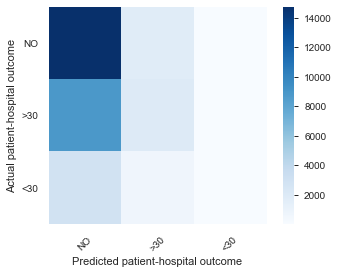

In [19]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

classes = ['NO', '>30', '<30']
plt.imshow(mcm, interpolation="nearest", cmap=plt.cm.Blues)
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)
plt.xlabel("Predicted patient-hospital outcome")
plt.ylabel("Actual patient-hospital outcome")
plt.show()

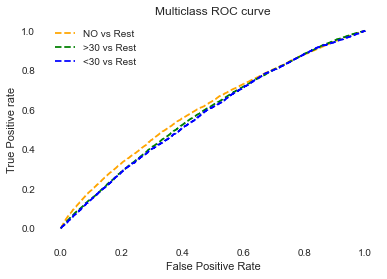

In [20]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

#Probability scores
diabetes_prob = multi_model.predict_proba(X_test)

fpr = {}
tpr = {}
thresh ={}
for i in range(len(classes)):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test, diabetes_prob[:,i], pos_label=i)
    
#ROC curve
plt.plot(fpr[0], tpr[0], linestyle='--',color='orange', label=classes[0] + ' vs Rest')
plt.plot(fpr[1], tpr[1], linestyle='--',color='green', label=classes[1] + ' vs Rest')
plt.plot(fpr[2], tpr[2], linestyle='--',color='blue', label=classes[2] + ' vs Rest')
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.show()

In [21]:
#AUC

auc = roc_auc_score(y_test,diabetes_prob, multi_class='ovr')
print('Average AUC:', auc)

Average AUC: 0.5905795104474706
